<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.en/cap01/cap01_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 1 Fundamentals and First Steps

This chapter inaugurates **Part 1** of the book, dedicated to the fundamentals of Digital Image Processing (DIP). The mathematical representation of digital images and the main methods for their manipulation are presented.

Python language and the `morph.py` library (ZAMPIROLLI, 2025) are used.

## 1.1 Objectives

At the end of this chapter, you will be able to:

- Understand the physical and mathematical nature of the digital image $f(x,y)$.
- Identify the bands of the electromagnetic spectrum relevant to DIP.
- Perform basic operations: reading, displaying, and saving images.
- Access and modify pixel intensities individually.
- Apply manual thresholding.

- Set up the Python development environment.
- Handle array structures (NumPy) without falling into memory traps.

## 1.2 Before you begin: Interactive *Notebooks*

This material was built under the concept of ***Literate Programming***, conceived by Donald Knuth in the 1980s (KNUTH, 1984). Knuth — also the creator of the **TeX** system for digital typesetting — proposed that programs be written as a logical narrative for human beings, interleaving code and documentation.

To run a cell, press <kbd>Shift</kbd> + <kbd>Enter</kbd> or click the ▶️ button.

> ### 📝 Note on the format
>
> In rendered versions (PDF or HTML), the code is presented in static blocks for reading and reference purposes. Interactive execution requires access via Google Colab (available at the top of the page) or in a local environment via VSCode or Jupyter Notebook.

## 1.3 Fundamentals

The study of image-based systems encompasses an ecosystem of integrated disciplines that transform raw visual data into structured knowledge. While some areas focus on generating representations, others are dedicated to processing and analyzing this data to support complex technological applications.

The diagram presented in [Figure 1.1](#fig-01-representacao) establishes the distinction and complementarity between Digital Image Processing (DIP) and Computer Vision (CV). DIP, highlighted in **green**, focuses on image-to-image transformation, aiming at quality improvement or preprocessing, such as noise removal and contrast enhancement.

In contrast, CV, marked in **blue**, focuses on interpreting visual content to extract models or information, such as object and gesture recognition. The intersection region illustrates the synergy between the areas, where DIP prepares the visual data for interpretation by CV. The map also demonstrates the interconnections of both disciplines with areas such as Robotics, Computer Graphics, Artificial Intelligence (AI), and Neuroscience.

<figure id="fig-01-representacao" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-pdf-vc.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.1:</strong> Relational diagram detailing the fundamental distinctions, synergies, and interconnections between DIP and CV in the context of image-based systems.</figcaption>
</figure>

### 1.3.1 👁️ Computer Vision

- **Focus:** *Image → Model* (inverse path of Computer Graphics).  
- **Goal:** Extract high-level information from images or videos.  
- **Typical applications:**
  - Robotics – obstacle detection, localization, and autonomous navigation.
  - Surveillance and inspection – event recognition, license plate reading, quality control.
  - Remote sensing – satellite image analysis, environmental mapping.
  - Medical imaging – tumor detection, organ segmentation, diagnostic support.
  - Human–computer interaction – gesture recognition, facial expression analysis, eye tracking.
- **Relationship with other fields:** leverages Machine Learning and AI techniques to classify and interpret scenes; serves as the "eyes" of Robotics.

### 1.3.2 🖼️ Digital Image Processing (DIP)

- **Focus:** *Image → Image* (typically—transformation of one image into another).  
- **Objective:** Enhance visual quality or extract low-level features.  
- **Common applications:**
  - Noise removal (mean, median, and Gaussian filters).
  - Contrast enhancement (histogram equalization, gamma adjustment).
  - Edge detection (Sobel, Canny, Laplacian).
  - Segmentation (thresholding, region growing, *watershed*).
  - Geometric transformations (resizing, rotation, perspective correction).
- **Relationship with other areas (see [Table 1.1](#tbl-01-relacoes)):**  
  - It is the **foundation** for most CV systems (preprocessing).  
  - Computer Graphics often applies DIP for postprocessing (e.g., smoothing, enhancement).  
  - AI techniques can optimize processing parameters (e.g., filter learning).

<a id="tbl-01-relacoes"></a>

**Tabela 1.1:** Connection among IP, CV, and other scientific areas.

| Area                     | Relation with IP and CV                                                                 |
|--------------------------|------------------------------------------------------------------------------------------|
| **Artificial Intelligence** | Provides models (neural networks, SVM) that interpret CV outputs.                         |
| **Robotics**             | Consumes CV data for decision-making (navigation, manipulation).                          |
| **Machine Learning**     | Uses descriptors extracted by IP/CV to train classifiers.                                 |
| **Computer Graphics**    | Inverse path: *model → image*; often applies IP for realistic rendering.                  |
| **Neuroscience**         | Inspires IP models (e.g., filters similar to retinal ganglion cells).                     |


## 1.4 PDI Stages

The PDI stages are presented in [Figure 1.2](#fig-01-etapas), which can be understood as a chain of transformations that reduces data redundancy in search of meaning:

*   **Low Level:** Acts directly on the pixels of the noisy image to perform enhancements and filtering, producing as output a clean or enhanced image.
*   **Medium Level:** Receives the processed image and performs segmentation and description, transforming the pixel matrix into structured attributes (shape, size, and texture).
*   **High Level:** Uses the attribute table to feed logic and artificial intelligence processes, resulting in the final decision or recognition (such as medical diagnosis).

<figure id="fig-01-etapas" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.2:</strong> Representation of the sequential processing flow: the output of each level becomes the input of the subsequent level.</figcaption>
</figure>

[Figure 1.3](#fig-01-etapas2) details the complete sequence of digital image processing (DIP), from acquisition to interpretation. The flow begins with Image Acquisition (1) and proceeds through Enhancement (2) and Restoration (3). Next, the content is isolated by Segmentation (4) and refined by Morphology (5). The crucial transition occurs in Representation and Description (6), where visual objects are converted into mathematical data (area, perimeter, etc.), enabling Recognition (7). Auxiliary processes include Color Image Processing and Compression, which contribute to the efficiency of storage and analysis.


<figure id="fig-01-etapas2" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas2.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.3:</strong> Detailed DIP flow: from sensory acquisition to attribute extraction and automated recognition, including color processing and compression.</figcaption>
</figure>

## 1.5 Image Formation and the Spectrum

The image formation process is grounded in the interaction between matter and radiant energy. Essentially, an image is conceived when a **sensor records the radiation** resulting from the interaction with a physical object. In the context of human vision and conventional photography, this phenomenon depends on a light source that illuminates the scene; the characteristics of the objects are then encoded through **variations in intensity and color** of the light reaching the sensor, as illustrated in [Figure 1.4](#fig-01-luz).

<figure id="fig-01-luz" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-luz.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.4:</strong> Representation of the visible spectrum and its position relative to other electromagnetic radiations, highlighting the variation in wavelengths from 380 nm to 750 nm.</figcaption>
</figure>

**Visible light** occupies only a small band of the electromagnetic spectrum — between **380 nm (violet)** and **750 nm (red)** — as illustrated in [Figure 1.5](#fig-01-espectro). Conventional digital sensors operate within this same window, but specialized equipment can capture radiation invisible to the human eye, such as infrared and X-rays. In digital image processing (DIP), the image formed depends directly on the spectral sensitivity of the sensor used.

<figure id="fig-01-espectro" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-espectro.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.5:</strong> \(A\) Complete electromagnetic spectrum on a logarithmic scale, highlighting the visible range. (B) Detail of visible light (380–750 nm) and its colors. (C) Decomposition of white light by the prism: shorter wavelengths undergo greater refraction, separating UV, visible, and infrared light.</figcaption>
</figure>

From this physical acquisition process, it becomes possible to mathematically model the digital image as a discrete two-dimensional function, in which each point of the scene is represented by numerical samples of light intensity, thus formalizing the concepts of pixel and digital image presented in the next section.

## 1.6 What is a Digital Image?

A **digital image** is formed by a grid of **pixels** (*Picture Elements*), where each pixel is the smallest elementary unit of the image.

> ### 💡 1.6.1 What is a Pixel?
>
> A **pixel** is the smallest addressable unit that makes up a digital image. Each pixel occupies a unique position in the grid and stores one or more numerical values that represent its intensity or color.

### Mathematical Representation

Unlike a continuous function, the domain of a digital image is a finite rectangular plane $\mathbb{E} \subset \mathbb{Z}^2$, which represents the sampling grid. This domain is indexed by integer coordinates:

<a id="eq-01-dominio"></a>
$$
\mathbb{E}  = \{ (x, y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H \} \tag{1.1}
$$


Where:

*   **$L$**: represents the width of the image (number of columns).
*   **$H$**: represents the height of the image (number of rows).

The digital image is a function that associates each pair of coordinates $(x,y)$ with one or more values that describe the pixel's appearance.

<a id="eq-01-image"></a>
$$
f: \mathbb{E}  \to \mathcal{V} \tag{1.2}
$$


The set $\mathcal{V}$ defines the possible values for the pixel (codomain), varying according to the image type, as demonstrated in [Table 1.2](#tbl-01-tipos-imagem).

<a id="tbl-01-tipos-imagem"></a>

**Tabela 1.2:** Main types of digital images and their respective sets of possible values for each pixel.

| Image type | $\mathcal{V}$ (pixel values) | Representation |
|:---|:---|:---:|
| **Binary** | $\{0, 1\}$ or $\{0, 255\}$ | ⬛◻️ |
| **Grayscale** | $\{0, 1, \dots, 255\}$ | ░▒▓█ |
| **Color (RGB)** | $\{0, \dots, 255\}^3$ (ordered triples of values) | 🟥🟩🟦 |


**Practical example:** A color image in the RGB model can be mathematically represented by a function that associates three intensity values with each pixel. Computationally, this representation corresponds to three overlapping matrices — the red (*Red*), green (*Green*), and blue (*Blue*) channels — in which each element stores the luminous intensity of the respective channel at a given position in the image.

To enable the practical experiments in PDI and VC, this book utilizes the Python scientific ecosystem, integrating libraries focused on matrix manipulation, image processing, and result visualization, as presented below.

## 1.7 Environment Setup

This material uses Python's scientific ecosystem, with emphasis on
**NumPy** (matrix computation), **OpenCV** (computer vision), and the
**morph.py** library (ZAMPIROLLI, 2025), developed for
didactic purposes and used throughout this book, as presented in
[Table 1.3](#tbl-01-bibliotecas).

The project is currently available in **Python** and **Portuguese**. Its
organization, however, allows for expansion into other programming
languages and languages.

The **Programming Exercises (PEs)** presented at the end of the chapters
can be validated by the `testsuite.py` module, which allows running test
cases in different languages, including Python, C, C++, Java, JavaScript, and
R. Thus, the same test cases can be used to verify
solutions developed in the *notebooks* and in **Moodle/VPL**.

<a id="tbl-01-bibliotecas"></a>

**Tabela 1.3:** Main libraries and modules used throughout this book for
matrix computation, DIP, CV, visualization, and validation of exercises.

| Library          | Main function                                      |
| :--------------- | :------------------------------------------------- |
| `numpy`          | Matrix representation and numerical operations     |
| `opencv-python`  | Reading, writing, and computer vision operations   |
| `matplotlib`     | Visualization of images and graphs                 |
| `morph.py`       | Didactic abstraction of DIP operations             |
| `testsuite.py`   | Execution and automatic validation of PEs          |


## 1.8 Versions of `morph.py`

The `morph.py` library has two public versions:

* **Version 1.0** — original version, published along with the paper
  presented at EduComp 2024:
  [version 1.0 repository](https://github.com/fzampirolli/morph)

* **Version 1.1** — version used in the activities of this book:
  [version 1.1 repository](https://github.com/fzampirolli/pdi-vc/blob/master/morph/morph.py)

Version 1.1 was adapted to also meet the memory constraints of
**Moodle/VPL** (Virtual Programming Laboratory). In version 1.0, some
libraries, such as `matplotlib`, `requests`, and `skimage`, were loaded at
the time of `import morph`. In environments with restricted resources, this
loading could exceed the memory limit and produce errors such as
`Jail: out of memory, 128MiB`.

In version 1.1, these *imports* were replaced by **lazy loading**:
each library is imported only by the method that actually
uses it. Thus, the `import morph` command maintains reduced initial
loading, primarily using `numpy` and `cv2`, while additional
resources are loaded on demand.

The configuration of the *notebooks* is centralized in the `config.py` file,
available in the same repository. This file checks dependencies,
seeks to ensure the use of **OpenCV 5.0**, and provides `morph.py` and, when
necessary, `testsuite.py`. When the environment does not have the appropriate version
of OpenCV, `config.py` can reinstall the required version and, if necessary,
request a restart of the execution environment.

Thus, the *notebooks* use a single configuration routine,
reducing code repetition and facilitating the reproduction of the computational
environment used in this book.

In [1]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Environment ready. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


## 1.9 Matrix Fundamentals — Caution with Reference Copying

Since a digital image can be represented by a matrix, it is important to understand how to create and manipulate matrices correctly. In Python, there is a common pitfall when using the `*` operator with lists:

> ### ⚠️ Caution with Reference Copying
>
> When executing `m = [[0]*2]*3`, three independent rows are not created. Instead, three references to the **same list** are created. Consequently, modifying an element in one of the rows will also modify the corresponding element in the other rows.

To visualize this behavior, one can run the code in [Python Tutor](https://pythontutor.com/) and compare it with the correct way of creating a matrix using lists: `m = [[0]*2 for _ in range(3)]`.

In practice, for digital image processing (DIP), it is recommended to use **NumPy**, which provides efficient multidimensional data structures and vectorized operations suitable for image manipulation. The following code presents different ways of creating synthetic images, whose results are displayed in [Figure 1.6](#fig-imagens-sinteticas).

Random matrix generated:
217 164  58  54  15  48 
 42 233 242  28 155 171 
 48 231  87 225  29 235 
239 187  89  49 116 209 



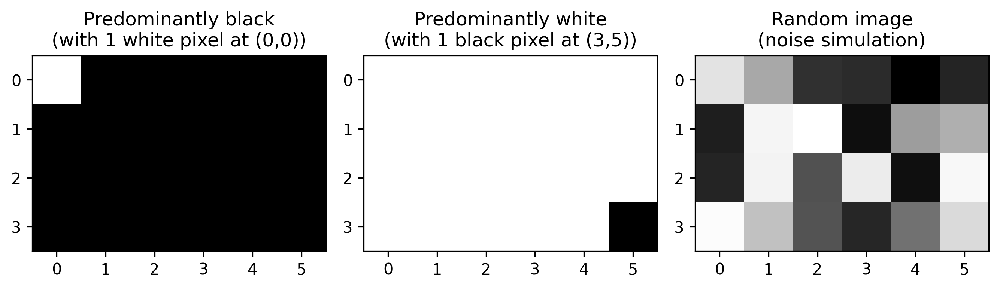

**Figure 1.6:** Examples of synthetic images represented as matrices.


In [2]:
import numpy as np

# Creating a black image (zeros) of 4, 6 pixels
img_preta = np.zeros((4, 6), dtype='uint8')
img_preta[0,0] = 255  # white pixel in the upper-left corner

# Creating a white image (255) of 4, 6 pixels
img_branca = np.ones((4, 6), dtype='uint8') * 255
img_branca[3,5] = 0  # black pixel in the lower-right corner

# Creating a random image for testing (noise)
img_random = mm.randomImage(4, 6, maxValue=255)

print("Random matrix generated:")
print(mm.drawImg(img_random))

mm.show(
    [img_preta, img_branca, img_random],
    titles=[
        "Predominantly black\n(with 1 white pixel at (0,0))",
        "Predominantly white\n(with 1 black pixel at (3,5))",
        "Random image\n(noise simulation)"
    ],
    cols=3,
    figsize=(9, 3),
    axis=True
)

## 1.10 Reading and Displaying Images

In libraries such as [NumPy](https://numpy.org/?utm_source=chatgpt.com), [OpenCV](https://opencv.org/?utm_source=chatgpt.com), and [scikit-image](https://scikit-image.org/?utm_source=chatgpt.com), digital images are often computationally represented as NumPy *arrays*. In this way, matrix operations and linear algebra concepts can be applied directly to digital image processing (DIP).

One of the fundamental operations in digital image processing (PDI) is image reading.

In the `morph.py` library, the function `mm.read()` allows loading images from both local files and URLs, as illustrated in [Figure 1.7](#fig-01-natureza)..

Dimensions (H, W, Channels): (1365, 2048, 3)
Data type: uint8


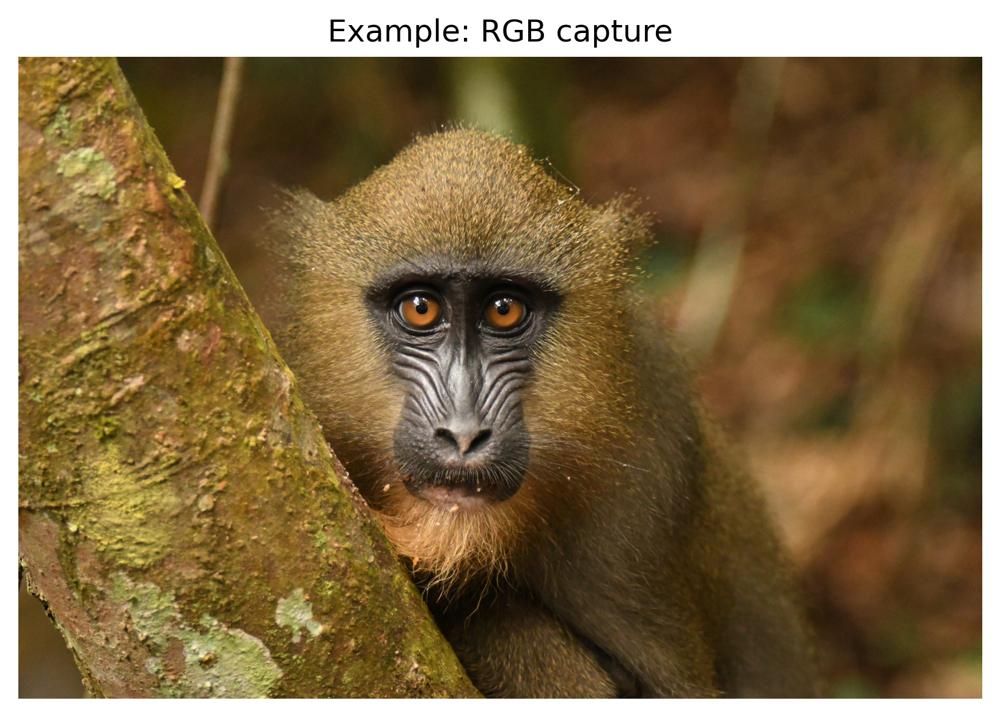

**Figure 1.7:** Mandrill (Mandrillus sphinx) in natural environment. Credit: Julien Renoult (CC BY 4.0).


In [3]:
import os
import numpy as np

url     = "https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg"
caminho = "imagens/mandrill.png"

if not os.path.exists(caminho):
    os.makedirs("imagens", exist_ok=True)
    img_obj = mm.read(url, pil=True)
    mm.write(img_obj, caminho)
else:
    img_obj = mm.read(caminho, pil=True)

img = np.array(img_obj)

print(f"Dimensions (H, W, Channels): {img.shape}")
print(f"Data type: {img.dtype}")

mm.show(img, title="Example: RGB capture")

### 1.10.1 Alternative: *Downloading* the Image for Local Storage

In environments where direct reading from URLs is unavailable—due to network restrictions, firewall policies, or lack of connectivity—an alternative is to download the image to the local file system beforehand. Once stored, the image can be loaded normally using the `mm.read()` function. In the example below, the file is saved locally with the name `mandrill.png`.

```bash
!wget -O mandrill.png \
    https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
```

```python
img = mm.read('mandrill.png')
mm.show(img, title="Example: RGB Capture (local file)")
```

#### 1.10.1.1 Explanation

* `wget -O mandrill.png <URL>` downloads the image and stores it locally with the specified name;
* `mm.read('mandrill.png')` reads the file directly from the file system, without requiring additional HTTP requests;
* this strategy reduces dependence on connectivity during experiments and avoids repeated downloads of the same image.

> 💡 **Note **
>
> 
> The `!` prefix is used in notebook-based environments, such as [Jupyter Notebook](https://jupyter.org/?utm_source=chatgpt.com), [JupyterLab](https://jupyter.org/?utm_source=chatgpt.com), and [Google Colab](https://colab.research.google.com/?utm_source=chatgpt.com), to execute operating system commands directly in code cells. In conventional terminals, the command must be used without the `!` prefix.
> 
> If the `wget` utility is not installed, the following alternative can be used:
> 
> ```bash
> !curl -o mandrill.png \
>     https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
> ```

## 1.11 Type Conversion and Thresholding

As we have seen, a color image in the RGB space is represented by the function:

<a id="eq-01-cinza"></a>
$$
f: \mathbb{E} \to \{0,1,\dots,255\}^3
$$

That is, for each pixel $(x,y)$, we have three values $(R,G,B)$ that define its color.

### Conversion to Grayscale

To convert an RGB image to grayscale, it is necessary to combine the three channels into a single intensity value $g$, which represents the perceived brightness. Since the human eye is not equally sensitive to red, green, and blue, a **weighted average** is used. The [ITU-R BT.601](https://www.itu.int/rec/R-REC-BT.601/) standard ({ITU-R}, 2011) defines the following weights:

$$
g = 0.299\,R + 0.587\,G + 0.114\,B \tag{1.3}
$$


After the calculation, the value $g$ is rounded to the nearest integer and adjusted to the interval $[0, 255]$. The result is a new image, now in grayscale, represented by:

<a id="eq-01-limiar"></a>
$$
f_{\text{gray}}: \mathbb{E} \to \{0,1,\dots,255\}
$$

### Thresholding

From the grayscale image $f_{\text{gray}}(x,y)$, a fundamental operation is **thresholding**, which produces a **binary** image (only black and white). To do this, a cutoff value $T$ is chosen (usually in the interval $[0,255]$) and defined as:

$$
f_{\text{bin}}(x,y) = 
\begin{cases} 
255 & \text{if } f_{\text{gray}}(x,y) > T \\[4pt]
0 & \text{otherwise}
\end{cases} \tag{1.4}
$$


**Example:** With $T = 128$, pixels with intensity above 128 become white (255); the remaining ones become black (0).

Thresholding is widely used to **segment objects from the background**, extract edges, or create binary masks for further processing.

> **Note:** The value 255 represents maximum white in 8-bit images, while 0 represents absolute black.

### Practical example of conversion and thresholding

[Figure 1.8](#fig-01-processamento-basico) illustrates the main steps to transform a color image into grayscale and then convert it into a binary image by thresholding.
The following code implements these steps:

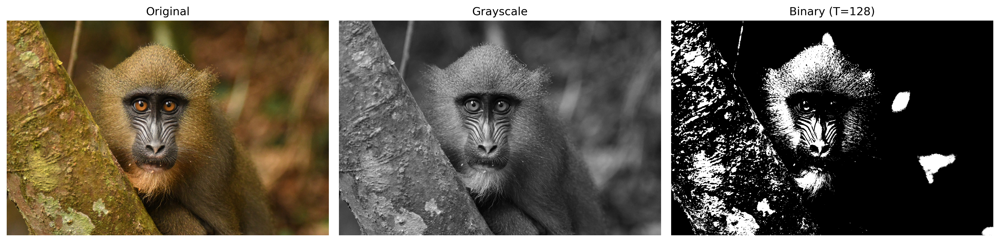

**Figure 1.8:** Basic image processing: (a) original image, (b) grayscale image, (c) image binarized by threshold (T=128).


In [4]:
# 1. Convert to Grayscale
img_gray = mm.gray(img)

# 2. Apply threshold (Pixels > 128 become 255, others 0)
limiar = 128
img_binaria = mm.threshold(img_gray, limiar)

# Using the new function
mm.show(
    [img, img_gray, img_binaria], 
    titles=["Original", "Grayscale", f"Binary (T={limiar})"],
    cols=3
)

## 1.12 Otsu's Method Thresholding

As presented in [Equation 1.4](#eq-01-limiar), thresholding converts a grayscale image into a binary one using a cutoff value $T$. So far, we have manually set $T = 128$.

```python
img_bin_fixo = mm.threshold(img_gray, T=128)
```

However, manually choosing $T$ is not always trivial. The `mm` library offers an automatic alternative: when the `limiar` parameter is **not provided**, the `mm.threshold(img_gray)` function computes the value of $T$ using **Otsu's method** (OTSU, 1979). This method, which will be detailed in future chapters, maximizes the inter-class variance of the histogram (frequency of each gray level), automatically separating object and background pixels.

The code below compares manual thresholding ($T=128$) with automatic thresholding (Otsu), also showing the computed value of $T$:

Threshold calculated by Otsu: T = 95.0


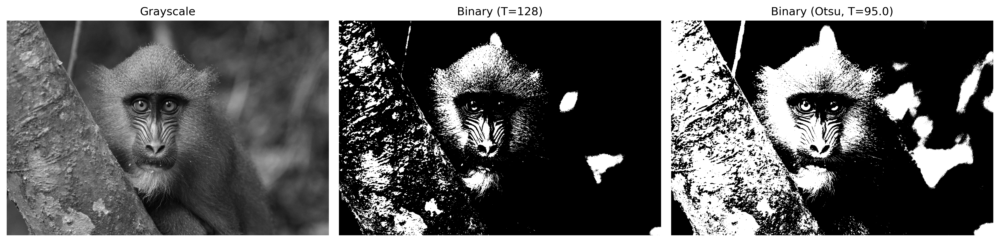

**Figure 1.9:** Comparison between manual thresholding (T=128) and automatic (Otsu) on the grayscale image.


In [5]:
import cv2
# Thresholding with fixed T (manual)
T_fixo = 128
img_bin_fixo = mm.threshold(img_gray, T_fixo)

# Thresholding by Otsu's method (automatic T)
T_otsu, img_bin_otsu = cv2.threshold(img_gray, 0, 255,
                                      cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f'Threshold calculated by Otsu: T = {T_otsu}')
# or simply:
# img_bin_otsu = mm.threshold(img_gray)

# Side-by-side display
mm.show(
    [img_gray, img_bin_fixo, img_bin_otsu], 
    titles=["Grayscale", f"Binary (T={T_fixo})", f"Binary (Otsu, T={T_otsu})"],
    cols=3
)

The [Figure 1.9](#fig-01-otsu) shows that the threshold obtained by Otsu automatically adapts to the image, resulting in more efficient binarization than a fixed value, especially when the object and background intensities are well separated in the histogram. This technique is widely used in CV systems for document binarization, object detection, and image preprocessing.

> 💡 **Simplicity of the `morph.py` library **
>
> 
> While OpenCV requires the full call:
> 
> ```python
> T_otsu, img_bin = cv2.threshold(img_gray, 0, 255,
>                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)
> ```
> 
> the `mm` library abstracts all this complexity: simply call `mm.threshold(img_gray)`. The Otsu threshold is calculated automatically and the binary image is returned directly. This approach allows one to focus on the concept rather than implementation details.

## 1.13 Accessing Pixels

In Python with NumPy, an image is structured as a **multidimensional array**. Accessing a specific pixel uses the matrix convention of **row** (Y axis) and **column** (X axis): `img[row, column]`.

The code in [Figure 1.10](#fig-01-pixel-acesso) demonstrates how to extract these values in color (RGB) and grayscale images, as well as how to isolate the immediate neighborhood of the point of interest.

📌 VALUES AT THE TARGET PIXEL (600, 800):
   • Grayscale (Scalar)       : 81
   • Colored (RGB Vector)     : R=92, G=78, B=67
--------------------------------------------------
🔍 3x3 NEIGHBORHOOD MATRIX IN GRAYSCALE:
   (The central target pixel is highlighted with brackets)

     83    96   105 
     85  [ 81]   96 
     83    77    84 


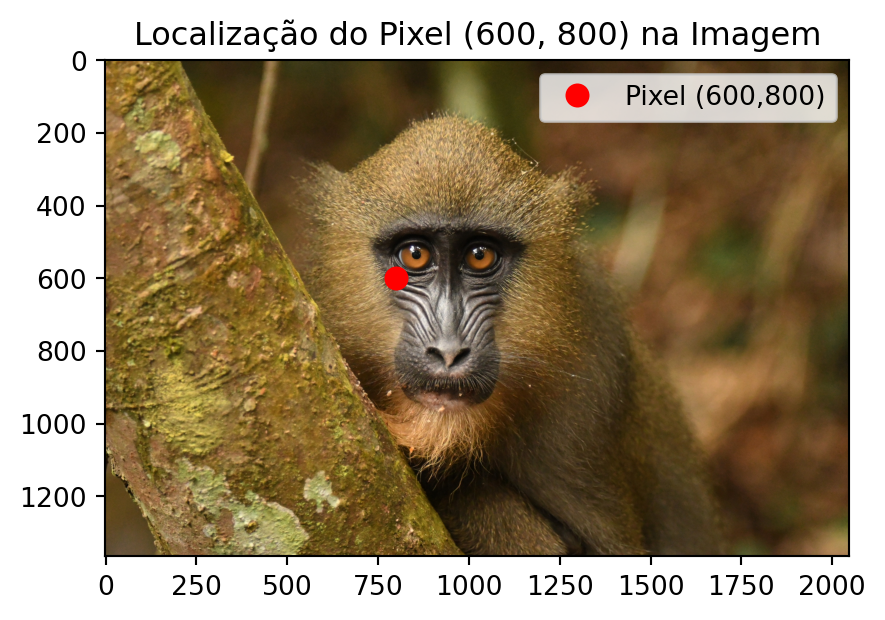

**Figure 1.10:** Accessing a specific pixel (r, c) and the representation of its neighborhood in the image.


In [6]:
import matplotlib.pyplot as plt

# 1. Definition of the target pixel coordinates
r, c = 600, 800

# 2. Direct access to pixel values
pixel_cinza = img_gray[r, c]
pixel_rgb   = img[r, c]

print(f"📌 VALUES AT THE TARGET PIXEL ({r}, {c}):")
print(f"   • Grayscale (Scalar)       : {pixel_cinza}")
print(f"   • Colored (RGB Vector)     : R={pixel_rgb[0]}, G={pixel_rgb[1]}, B={pixel_rgb[2]}")
print("-" * 50)

# 3. Didactic display of the 3x3 neighborhood around the pixel (r, c)
# Crops from row r-1 to r+1, and from column c-1 to c+1
vizinhanca_gray = img_gray[r-1:r+2, c-1:c+2]

print(f"🔍 3x3 NEIGHBORHOOD MATRIX IN GRAYSCALE:")
print(f"   (The central target pixel is highlighted with brackets)\n")

# Formatted printing to highlight the central pixel
for i, linha in enumerate(vizinhanca_gray):
    linhas_str = []
    for j, valor in enumerate(linha):
        if i == 1 and j == 1:
            linhas_str.append(f"[{valor:3d}]") # Highlights the center (100, 100)
        else:
            linhas_str.append(f" {valor:3d} ")
    print("   " + " ".join(linhas_str))

# 4. Visual demonstration using mm.show (optional, but excellent for the book)
# Shows the entire image with a point marking the region
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.plot(c, r, 'ro', markersize=8, label=f'Pixel ({r},{c})') # Plots (x, y) -> (c, r)
plt.title(f"Localização do Pixel ({r}, {c}) na Imagem")
plt.legend()
plt.axis('on') # Keeps the axes so the student can see the coordinates 100, 100
plt.show()

**Line-by-line explanation:**

1. `img_gray[r, c]` — Returns a single integer value (scalar) between 0 and 255, representing the brightness intensity of the gray pixel.
2. `img[r, c]` — Returns a vector with three values `[R, G, B]`, corresponding to the intensities of the Red, Green, and Blue channels.
3. `img_gray[r-1:r+2, c-1:c+2]` — Performs slicing to extract the $3\times 3$ submatrix around the pixel. This operation is the basis for implementing spatial filters and convolutions.
4. The subsequent `for` loop merely formats this submatrix in the console, displaying the central pixel within square brackets `[ ]` for didactic purposes.
5. The function `plt.plot(c, r, 'ro')` plots a red point over the image to correlate the numerical coordinate with its visual position. Note that Matplotlib uses the standard screen order `(X, Y)`, inverting it to `(c, r)`.

Since indexing in Python is zero-based, the top-left corner of the image is the coordinate `(0,0)`. Always keep this rule in mind: the first dimension of the matrix controls the **height** (rows/Y) and the second controls the **width** (columns/X).

## 1.14 Summary

In this chapter, the fundamentals of digital image representation were presented: the definition of pixel, the structuring of images into matrices, and the impact of sampling and quantization on final quality:

- **Digital image** = function $f(x,y)$ that maps coordinates to intensities (scalar or vectorial).
- **Domain**: finite set $\mathbb{E} = \{(x,y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H\}$.
- **Main types**: binary ($\mathcal{V} = \{0, 255\}$), grayscale ($\mathcal{V} = [0,255]$), and RGB ($\mathcal{V} = [0,255]^3$).
- **Thresholding** converts grayscale into binary; **Otsu's method** automatically determines the cutoff value by maximizing between-class variance.

- The `morph.py` library (or `mm`) provides educational functions for basic digital image processing (DIP) operations, such as `mm.gray()`, `mm.threshold()`, and `mm.show_multiple()`.
- **NumPy Trap**: never use `[[0]*n]*m` to create matrices — always use `np.zeros()` or `np.ones()`.
- Pixel access via `img[row, column]`, with ***zero-based*** indexing.

Chapter 2 will cover **histograms and contrast equalization**.

## 1.15 🤖 Using Gemini Notebook as a Complementary Tutor

In this edition, in addition to the interactive *notebooks* on Google Colab, **Gemini Notebook** is available as a complementary study tool. The platform uses exclusively the documents provided by the author as its knowledge base, ensuring responses that are consistent with the book’s content.

> ### ❗ 🎓 Study with the Intelligent Tutor
>
> Access the chapter’s environment via the *link* below and especially explore the **Study Guide** and **Conversation** options to deepen your understanding.
>
> [🚀 ACCESS Gemini Notebook: CHAPTER 01](https://notebooklm.google.com/notebook/022d09fb-4dee-46b1-ad18-787987fe976d)
>
> #### 🌐 Language and Programming Language
>
> The project for this chapter in Gemini Notebook was built using only the **Portuguese** text and the **Python** code examples. If you are studying from the English or French edition, or following the C++ track, the tutor’s responses may not exactly correspond to the version you are reading.
>
> #### ⚠️ Notice about AI-Generated Content
>
> AI is a powerful study ally, but the generated content may contain **errors or inaccuracies**. Always consult **books, scientific articles, and other reliable academic sources** to validate the information. Whenever possible, run the practical examples provided in this chapter to verify the results.

### Available Platform Features

The **Gemini Notebook** offers an advanced suite of AI-based tools to transform the static content of the book into a dynamic, multimedia learning experience. The platform employs **RAG** (*Retrieval-Augmented Generation*) techniques, grounded in the work of Lewis (2020), to base responses strictly on the provided documents and minimize the occurrence of hallucinations.

The main features include:

* **Multimodal Summaries (Audio and Video)**: Generation of natural conversations between experts in the **Audio Summary** format (*podcast*-style) and **Video Summary**, discussing the central themes of the chapter, such as the differences between PDI and VC, or the interpretation of transformations like thresholding and Otsu's method.
* **Structure Visualization (Mind Map and Infographic)**: Automatic creation of diagrams that visually connect concepts, for example, the processing flow from digital image capture, through conversion to grayscale, thresholding, and binary segmentation.
* **Assessment Tools (Quizzes and Flashcards)**: Generation of multiple-choice **Quizzes** and **Flashcards** for knowledge reinforcement, based on the authorial text (e.g., questions about the RGB-to-grayscale conversion formula or about the operation of global and Otsu thresholds).
* **Presentation Support (Slides and Reports)**: Assistance in structuring **Slide Presentations** and in writing technical **Reports**, facilitating the communication of experimental results with images.
* **Data Analysis (Data Table)**: Organization of data extracted from the text into structured tables, aiding the understanding of practical examples, such as the comparison between different threshold values.
* ***Contextual Chat***: Enables direct questioning about the code and theory, such as: *"How can I implement RGB-to-grayscale conversion using the weights of the ITU-R BT.601 standard?"* or *"What happens to the binary image if I choose a threshold T=200 instead of T=128?"*.

## 1.16 Exercise List

1. (15%) In your own words, define **digital image** and **pixel**. Give a concrete example of how a color (RGB) image is represented in matrix form in the computer.

2. (15%) Explain the differences between a **binary image**, **grayscale (8‑bit)**, and **RGB color** image, indicating the range of possible values for each pixel in each type.

3. (20%) Considering the RGB → grayscale conversion formula from the ITU‑R BT.601 standard:
   $$g = 0.299\,R + 0.587\,G + 0.114\,B$$
   Compute the grayscale pixel value for $(R,G,B) = (80, 180, 30)$. Round to the nearest integer.

4. (20%) What is **thresholding**? Explain the difference between choosing a fixed threshold $T$ (e.g., $T=128$) and using the **Otsu method** for automatic threshold determination. In a few words, how does the Otsu method select the threshold?

5. (15%) In the context of the didactic library `mm` discussed in the chapter, answer:
   - a) (7.5%) How do you access the pixel value at position (row=50, column=60) of a grayscale image `img_gray`?
   - b) (7.5%) What is the advantage of using `mm.threshold(img_gray)` without passing the threshold? Compare it with the equivalent call in OpenCV.

6. (15%) What does the `img.shape` property return for a NumPy image in RGB format? Provide a concrete example with a 640×480 pixel image.

## 1.17 Chapter References

The theoretical foundation of this chapter comprises the following works on DIP and CV:

* Gonzalez (2018) for the fundamentals of **Digital Image Processing** (DIP).
* Singh (2019) for the practical implementation of **image processing and analysis** methods.
* Szeliski (2022) for the study of CV and fundamental algorithms.
* Bradski (2008) for the application of the **OpenCV** library in a Python environment.
* Lewis (2020}) for the concept of **retrieval-augmented generation (RAG)**, used to support the processing of information in this material.

## Chapter References


BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

KNUTH, D. E. **Literate Programming**. 1984.

LEWIS, Patrick *et al*. **Retrieval-augmented generation for knowledge-intensive nlp tasks**. 2020.

OTSU, Nobuyuki. **A Threshold Selection Method from Gray-Level Histograms**. 1979.

SINGH, Himanshu. **Practical machine learning and image processing**. Springer, 2019.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

ZAMPIROLLI, Francisco de Assis *et al*. **Teaching Hands-On Digital Image Processing with morph.py: Methods and Comprehensive Results**. 2025.

{ITU-R}. **Recommendation BT.601: Studio encoding parameters of digital television for standard 4:3 and wide screen 16:9 aspect ratios**. 2011.